In [3]:
#%pip install torchxrayvision
import torchxrayvision as xrv
import skimage, torch, torchvision
import numpy as np
from PIL import Image
import pandas as pd
from tqdm import tqdm
import os

/clusteruy/home/jplago/apps/miniconda3/envs/conda_train_sd_py312/lib/python3.12/site-packages/torchxrayvision/utils.py:11: TqdmExperimentalWarning: Using `tqdm.autonotebook.tqdm` in notebook mode. Use `tqdm.tqdm` instead to force console mode (e.g. in jupyter console)
  from tqdm.autonotebook import tqdm


In [27]:

model = xrv.models.DenseNet(weights="densenet121-res224-all")
#model = xrv.models.DenseNet(weights="densenet121-res224-chex")

transform = torchvision.transforms.Compose([xrv.datasets.XRayCenterCrop(),xrv.datasets.XRayResizer(224)])

def get_predictions(img):
    # Prepare the image:
    if isinstance(img, str):
        img = skimage.io.imread(img)
    
    img = xrv.datasets.normalize(img, 255) # convert 8-bit image to [-1024, 1024] range
    img = img.mean(2)[None, ...] # Make single color channel
    
    img = transform(img)
    img = torch.from_numpy(img)
    
    # Process image

    outputs = model(img[None,...]) # or model.features(img[None,...]) 

    return dict(zip(model.pathologies,outputs[0].detach().numpy()))

def get_predictions(img):
    # Load image if it's a file path
    if isinstance(img, str):
        img = skimage.io.imread(img)

    # Convert PIL image to numpy array
    elif isinstance(img, Image.Image):
        img = np.array(img)

    # Normalize image
    img = xrv.datasets.normalize(img, 255)  # convert 8-bit image to [-1024, 1024] range

    # Ensure single color channel
    if img.ndim == 3 and img.shape[2] == 3:
        img = img.mean(2)
    img = img[None, ...]  # Add channel dimension

    # Apply transforms and convert to tensor
    img = transform(img)
    img = torch.from_numpy(img)

    # Run through model
    outputs = model(img[None, ...])

    return dict(zip(model.pathologies, outputs[0].detach().numpy()))


In [1]:
base_path = '/clusteruy/home/jplago/mimic-cxr-jpg/'
# Edema test csv
test_df = pd.read_csv('/clusteruy/home/jplago/mcdaa-thesis/datasets/test_edema_300.csv')
test_df

,study_id,dicom_id,record_path,report_path,label
0,54891883,398b9c15-85897d9b-b04d11e2-25092267-47db634a,p19_processed/p19800337/s54891883/398b9c15-858...,files/p19/p19800337/s54891883.txt,0.0
1,57954948,b0a4e877-3fcc6722-587d6246-93fb0af5-e32c2446,p19_processed/p19281042/s57954948/b0a4e877-3fc...,files/p19/p19281042/s57954948.txt,0.0
2,57490000,11f01d58-3af1a16e-63a75d10-29b87223-a0ca5ae8,p19_processed/p19411696/s57490000/11f01d58-3af...,files/p19/p19411696/s57490000.txt,0.0
3,53078178,7946af07-ad6b046f-88fe1b34-b18163ec-54307b1b,p19_processed/p19220361/s53078178/7946af07-ad6...,files/p19/p19220361/s53078178.txt,0.0
4,52188630,768add6e-45aac832-b0e04d67-0b6563a8-697f2cda,p19_processed/p19530575/s52188630/768add6e-45a...,files/p19/p19530575/s52188630.txt,0.0
...,...,...,...,...,...
295,58480414,858289cb-eefa6c9b-d1b8feb2-9124c1d8-c9cc1dbf,p19_processed/p19081257/s58480414/858289cb-eef...,files/p19/p19081257/s58480414.txt,0.0
296,58947208,dff2da43-a45db28b-7b00c42a-7daa59b9-edd0a42f,p19_processed/p19509694/s58947208/dff2da43-a45...,files/p19/p19509694/s58947208.txt,0.0
297,57583076,5f6fc597-0c49e213-f32031d9-e9755c5c-dc6d83d3,p19_processed/p19575582/s57583076/5f6fc597-0c4...,files/p19/p19575582/s57583076.txt,1.0
298,59705258,d96a7be3-2d1c3a11-87b7f32e-1e6caf1a-dce990f7,p19_processed/p19472857/s59705258/d96a7be3-2d1...,files/p19/p19472857/s59705258.txt,0.0


In [11]:
# one image pred
base_path = '/clusteruy/home/jplago/mimic-cxr-jpg/'
img_path = os.path.join(base_path, test_df.record_path.iloc[297])
get_predictions(img_path)

{'Atelectasis': np.float32(0.6223377),
 'Consolidation': np.float32(0.50135005),
 'Infiltration': np.float32(0.5498847),
 'Pneumothorax': np.float32(0.50697803),
 'Edema': np.float32(0.5165055),
 'Emphysema': np.float32(0.5003735),
 'Fibrosis': np.float32(0.52970374),
 'Effusion': np.float32(0.5680448),
 'Pneumonia': np.float32(0.5032222),
 'Pleural_Thickening': np.float32(0.425982),
 'Cardiomegaly': np.float32(0.58646315),
 'Nodule': np.float32(0.47867152),
 'Mass': np.float32(0.3659959),
 'Hernia': np.float32(0.008602461),
 'Lung Lesion': np.float32(0.34616017),
 'Fracture': np.float32(0.5006012),
 'Lung Opacity': np.float32(0.5625365),
 'Enlarged Cardiomediastinum': np.float32(0.5244908)}

In [31]:
# all predictions
pred_scores = []
for _, r in tqdm(test_df.iterrows()):
   img_path =  os.path.join(base_path, r.record_path)
   results = get_predictions(img_path)
   pred_scores.append(results['Edema']) 

300it [01:31,  3.27it/s]


In [32]:
test_df['pred_score'] = pred_scores
test_df['pred_label'] = [x > 0.5 for x in pred_scores]
test_df['pred_correct'] = test_df['label'].astype(bool) == test_df['pred_label']
test_df

,study_id,dicom_id,record_path,report_path,label,pred_scores,pred_labels,pred_score,pred_label,pred_correct
0,54891883,398b9c15-85897d9b-b04d11e2-25092267-47db634a,p19_processed/p19800337/s54891883/398b9c15-858...,files/p19/p19800337/s54891883.txt,0.0,0.465372,False,0.105956,False,True
1,57954948,b0a4e877-3fcc6722-587d6246-93fb0af5-e32c2446,p19_processed/p19281042/s57954948/b0a4e877-3fc...,files/p19/p19281042/s57954948.txt,0.0,0.186615,False,0.276335,False,True
2,57490000,11f01d58-3af1a16e-63a75d10-29b87223-a0ca5ae8,p19_processed/p19411696/s57490000/11f01d58-3af...,files/p19/p19411696/s57490000.txt,0.0,0.242184,False,0.103336,False,True
3,53078178,7946af07-ad6b046f-88fe1b34-b18163ec-54307b1b,p19_processed/p19220361/s53078178/7946af07-ad6...,files/p19/p19220361/s53078178.txt,0.0,0.160519,False,0.010467,False,True
4,52188630,768add6e-45aac832-b0e04d67-0b6563a8-697f2cda,p19_processed/p19530575/s52188630/768add6e-45a...,files/p19/p19530575/s52188630.txt,0.0,0.503518,True,0.500654,True,False
...,...,...,...,...,...,...,...,...,...,...
295,58480414,858289cb-eefa6c9b-d1b8feb2-9124c1d8-c9cc1dbf,p19_processed/p19081257/s58480414/858289cb-eef...,files/p19/p19081257/s58480414.txt,0.0,0.026356,False,0.040478,False,True
296,58947208,dff2da43-a45db28b-7b00c42a-7daa59b9-edd0a42f,p19_processed/p19509694/s58947208/dff2da43-a45...,files/p19/p19509694/s58947208.txt,0.0,0.526585,True,0.512692,True,False
297,57583076,5f6fc597-0c49e213-f32031d9-e9755c5c-dc6d83d3,p19_processed/p19575582/s57583076/5f6fc597-0c4...,files/p19/p19575582/s57583076.txt,1.0,0.535073,True,0.516505,True,True
298,59705258,d96a7be3-2d1c3a11-87b7f32e-1e6caf1a-dce990f7,p19_processed/p19472857/s59705258/d96a7be3-2d1...,files/p19/p19472857/s59705258.txt,0.0,0.128467,False,0.145776,False,True


In [33]:
acc = test_df['pred_correct'].sum() / len(test_df)
acc

np.float64(0.74)

### Create synthetic datasets

In [25]:
prompts = pd.read_csv('/clusteruy/home/jplago/mcdaa-thesis/external/diffusion-classifier/prompts/mimic_cxr_edema.csv')
#prompts = pd.read_csv('/clusteruy/home/jplago/mcdaa-thesis/external/diffusion-classifier/prompts/mimic_cxr_atelectasis.csv')
#prompts = pd.read_csv('/clusteruy/home/jplago/mcdaa-thesis/external/diffusion-classifier/prompts/mimic_cxr_effusion.csv')
#prompts = pd.read_csv('/clusteruy/home/jplago/mcdaa-thesis/external/diffusion-classifier/prompts/mimic_cxr_cardiomegaly.csv')
#prompts = pd.read_csv('/clusteruy/home/jplago/mcdaa-thesis/external/diffusion-classifier/prompts/mimic_cxr_pneumothorax.csv')
prompts

,prompt,classname,classidx
0,no pulmonary edema,0,0
1,pulmonary edema,1,1


In [13]:
import torch
from diffusers import StableDiffusionPipeline

model_path = "/clusteruy/home/jplago/roentgen/roentgen"
device='cuda' 

pipe = StableDiffusionPipeline.from_pretrained(model_path).to(torch.float32).to(device)

def generate_image(prompt):
    output = pipe([prompt], num_inference_steps=75, height=512, width=512, guidance_scale=4)
    return output.images[0]

Loading pipeline components...:   0%|          | 0/7 [00:00<?, ?it/s]

An error occurred while trying to fetch /clusteruy/home/jplago/roentgen/roentgen/unet: Error no file named diffusion_pytorch_model.safetensors found in directory /clusteruy/home/jplago/roentgen/roentgen/unet.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.
An error occurred while trying to fetch /clusteruy/home/jplago/roentgen/roentgen/vae: Error no file named diffusion_pytorch_model.safetensors found in directory /clusteruy/home/jplago/roentgen/roentgen/vae.
Defaulting to unsafe serialization. Pass `allow_pickle=False` to raise an error instead.


  0%|          | 0/75 [00:00<?, ?it/s]

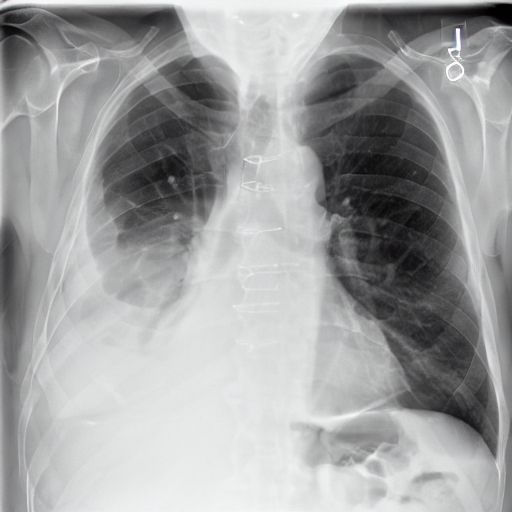

In [14]:
# Test model
prompt = "big right-sided pleural effusion"
img = generate_image(prompt)
img

In [12]:
get_predictions(img)

{'Atelectasis': np.float32(0.6294285),
 'Consolidation': np.float32(0.54558444),
 'Infiltration': np.float32(0.4494343),
 'Pneumothorax': np.float32(0.53062105),
 'Edema': np.float32(0.08561976),
 'Emphysema': np.float32(0.504331),
 'Fibrosis': np.float32(0.50674456),
 'Effusion': np.float32(0.8431462),
 'Pneumonia': np.float32(0.14381664),
 'Pleural_Thickening': np.float32(0.52144706),
 'Cardiomegaly': np.float32(0.53124404),
 'Nodule': np.float32(0.51471186),
 'Mass': np.float32(0.54424894),
 'Hernia': np.float32(0.042339697),
 'Lung Lesion': np.float32(0.5055429),
 'Fracture': np.float32(0.5082611),
 'Lung Opacity': np.float32(0.53313994),
 'Enlarged Cardiomediastinum': np.float32(0.517629)}

  0%|          | 0/75 [00:00<?, ?it/s]

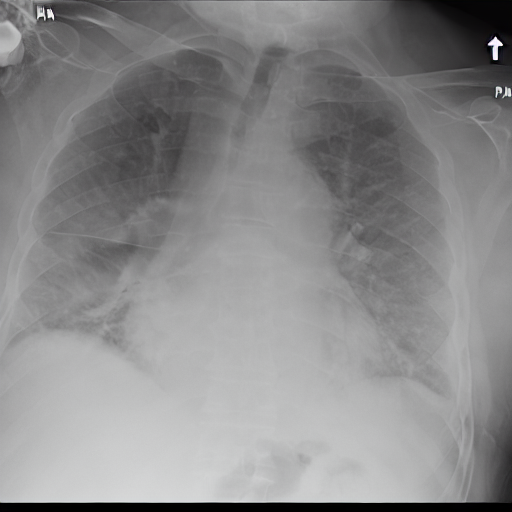

  0%|          | 0/75 [00:00<?, ?it/s]

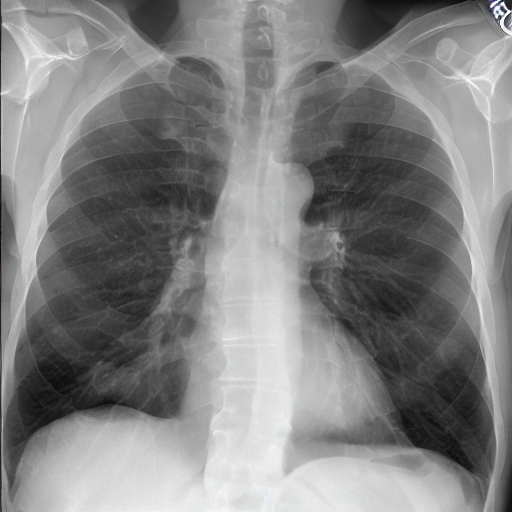

In [24]:
prompt = "pulmonary edema"
img = generate_image(prompt)
display(img)
#print(get_predictions(img))

prompt = "no pulmonary edema"
img = generate_image(prompt)
display(img)
#print(get_predictions(img))


PULMONARY EDEMA


  0%|          | 0/75 [00:00<?, ?it/s]

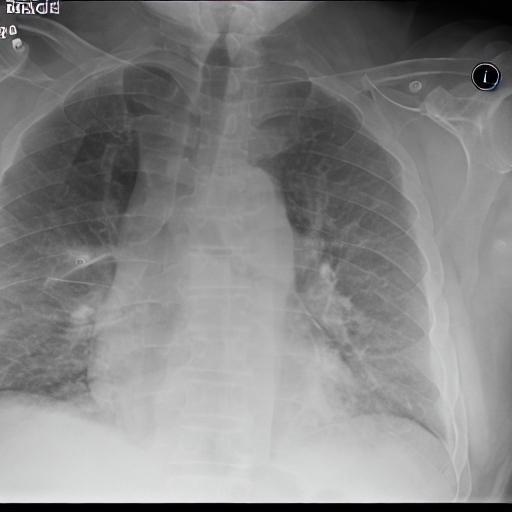

{'Atelectasis': np.float32(0.5268783), 'Consolidation': np.float32(0.5364592), 'Infiltration': np.float32(0.6115905), 'Pneumothorax': np.float32(0.51255774), 'Edema': np.float32(0.50595653), 'Emphysema': np.float32(0.5009357), 'Fibrosis': np.float32(0.5449001), 'Effusion': np.float32(0.56762326), 'Pneumonia': np.float32(0.51857585), 'Pleural_Thickening': np.float32(0.52827305), 'Cardiomegaly': np.float32(0.5120554), 'Nodule': np.float32(0.53377235), 'Mass': np.float32(0.6127323), 'Hernia': np.float32(0.18146433), 'Lung Lesion': np.float32(0.01325988), 'Fracture': np.float32(0.39326698), 'Lung Opacity': np.float32(0.7683808), 'Enlarged Cardiomediastinum': np.float32(0.56171405)}


  0%|          | 0/75 [00:00<?, ?it/s]

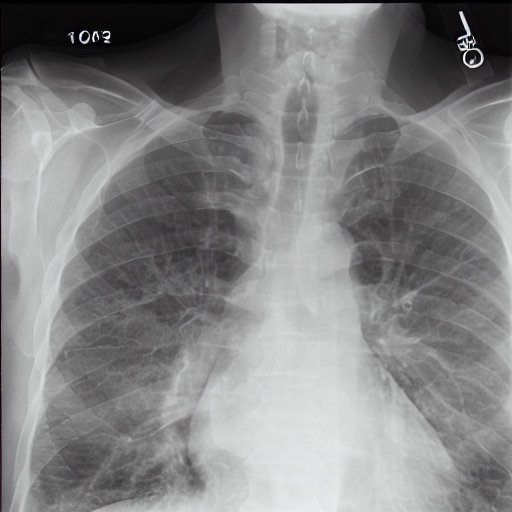

{'Atelectasis': np.float32(0.55796736), 'Consolidation': np.float32(0.53532577), 'Infiltration': np.float32(0.63874376), 'Pneumothorax': np.float32(0.51157963), 'Edema': np.float32(0.52052915), 'Emphysema': np.float32(0.5070865), 'Fibrosis': np.float32(0.564046), 'Effusion': np.float32(0.5900103), 'Pneumonia': np.float32(0.5483537), 'Pleural_Thickening': np.float32(0.51954293), 'Cardiomegaly': np.float32(0.56826514), 'Nodule': np.float32(0.5225228), 'Mass': np.float32(0.51553357), 'Hernia': np.float32(0.2842232), 'Lung Lesion': np.float32(0.0337516), 'Fracture': np.float32(0.39711213), 'Lung Opacity': np.float32(0.6957854), 'Enlarged Cardiomediastinum': np.float32(0.5165025)}


  0%|          | 0/75 [00:00<?, ?it/s]

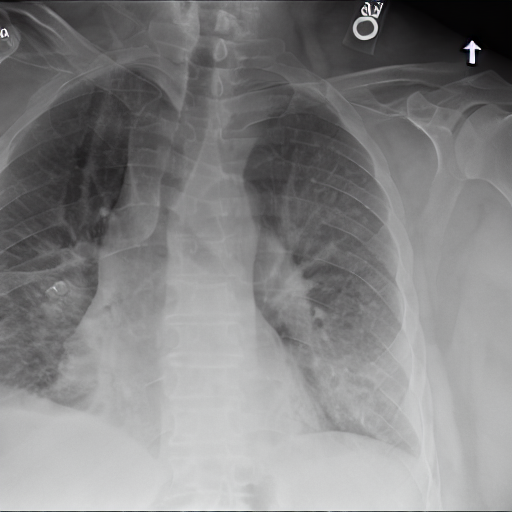

{'Atelectasis': np.float32(0.5065499), 'Consolidation': np.float32(0.5713756), 'Infiltration': np.float32(0.5625911), 'Pneumothorax': np.float32(0.5252416), 'Edema': np.float32(0.50043887), 'Emphysema': np.float32(0.5044528), 'Fibrosis': np.float32(0.5464777), 'Effusion': np.float32(0.52567446), 'Pneumonia': np.float32(0.5449778), 'Pleural_Thickening': np.float32(0.52792716), 'Cardiomegaly': np.float32(0.24013473), 'Nodule': np.float32(0.5547817), 'Mass': np.float32(0.82372755), 'Hernia': np.float32(0.001568742), 'Lung Lesion': np.float32(0.061211355), 'Fracture': np.float32(0.208662), 'Lung Opacity': np.float32(0.8652628), 'Enlarged Cardiomediastinum': np.float32(0.63365054)}


  0%|          | 0/75 [00:00<?, ?it/s]

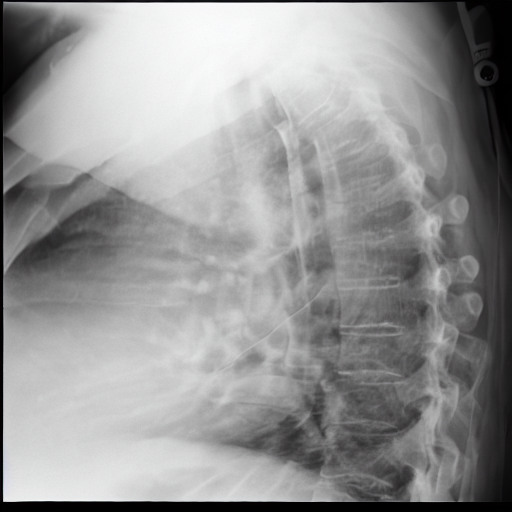

{'Atelectasis': np.float32(0.51484084), 'Consolidation': np.float32(0.5209874), 'Infiltration': np.float32(0.535679), 'Pneumothorax': np.float32(0.5030688), 'Edema': np.float32(0.2489164), 'Emphysema': np.float32(0.5016914), 'Fibrosis': np.float32(0.5018035), 'Effusion': np.float32(0.35291618), 'Pneumonia': np.float32(0.24409436), 'Pleural_Thickening': np.float32(0.17674442), 'Cardiomegaly': np.float32(0.5073551), 'Nodule': np.float32(0.5029707), 'Mass': np.float32(0.5134315), 'Hernia': np.float32(0.028727967), 'Lung Lesion': np.float32(0.025533637), 'Fracture': np.float32(0.5049645), 'Lung Opacity': np.float32(0.61383337), 'Enlarged Cardiomediastinum': np.float32(0.47630015)}


  0%|          | 0/75 [00:00<?, ?it/s]

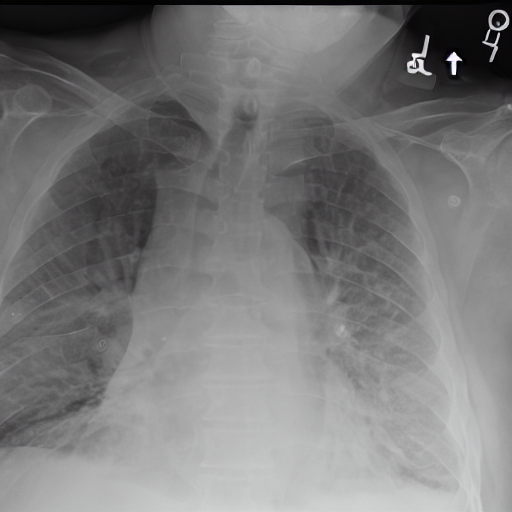

{'Atelectasis': np.float32(0.5168778), 'Consolidation': np.float32(0.6047667), 'Infiltration': np.float32(0.64383996), 'Pneumothorax': np.float32(0.51542014), 'Edema': np.float32(0.56345165), 'Emphysema': np.float32(0.50473976), 'Fibrosis': np.float32(0.5310531), 'Effusion': np.float32(0.6382481), 'Pneumonia': np.float32(0.7937168), 'Pleural_Thickening': np.float32(0.5187994), 'Cardiomegaly': np.float32(0.364503), 'Nodule': np.float32(0.5401801), 'Mass': np.float32(0.58552825), 'Hernia': np.float32(0.005319046), 'Lung Lesion': np.float32(0.028964542), 'Fracture': np.float32(0.26737532), 'Lung Opacity': np.float32(0.931131), 'Enlarged Cardiomediastinum': np.float32(0.585037)}
NO PULMONARY EDEMA


  0%|          | 0/75 [00:00<?, ?it/s]

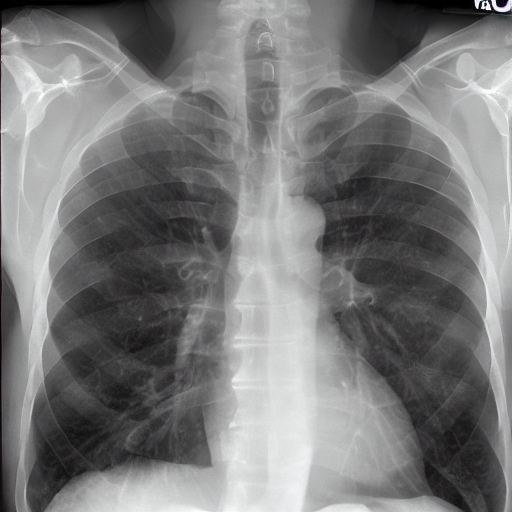

{'Atelectasis': np.float32(0.057233106), 'Consolidation': np.float32(0.07672165), 'Infiltration': np.float32(0.4380373), 'Pneumothorax': np.float32(0.5019126), 'Edema': np.float32(0.02505696), 'Emphysema': np.float32(0.51460063), 'Fibrosis': np.float32(0.50273126), 'Effusion': np.float32(0.0389028), 'Pneumonia': np.float32(0.060508482), 'Pleural_Thickening': np.float32(0.29744735), 'Cardiomegaly': np.float32(0.11901237), 'Nodule': np.float32(0.5041542), 'Mass': np.float32(0.13000734), 'Hernia': np.float32(0.003918881), 'Lung Lesion': np.float32(0.05829587), 'Fracture': np.float32(0.38318843), 'Lung Opacity': np.float32(0.08221583), 'Enlarged Cardiomediastinum': np.float32(0.07186677)}


  0%|          | 0/75 [00:00<?, ?it/s]

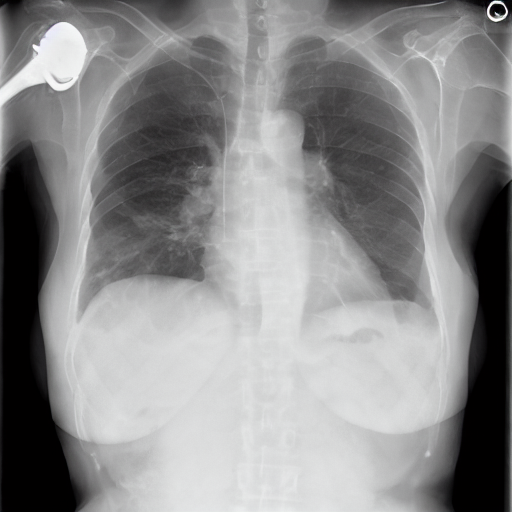

{'Atelectasis': np.float32(0.51418036), 'Consolidation': np.float32(0.17805625), 'Infiltration': np.float32(0.46546352), 'Pneumothorax': np.float32(0.20440537), 'Edema': np.float32(0.009455494), 'Emphysema': np.float32(0.5013757), 'Fibrosis': np.float32(0.55213046), 'Effusion': np.float32(0.10146019), 'Pneumonia': np.float32(0.18710427), 'Pleural_Thickening': np.float32(0.5120711), 'Cardiomegaly': np.float32(0.06743262), 'Nodule': np.float32(0.511168), 'Mass': np.float32(0.3088472), 'Hernia': np.float32(0.041604485), 'Lung Lesion': np.float32(0.001100913), 'Fracture': np.float32(0.5010035), 'Lung Opacity': np.float32(0.36531273), 'Enlarged Cardiomediastinum': np.float32(0.08143643)}


  0%|          | 0/75 [00:00<?, ?it/s]

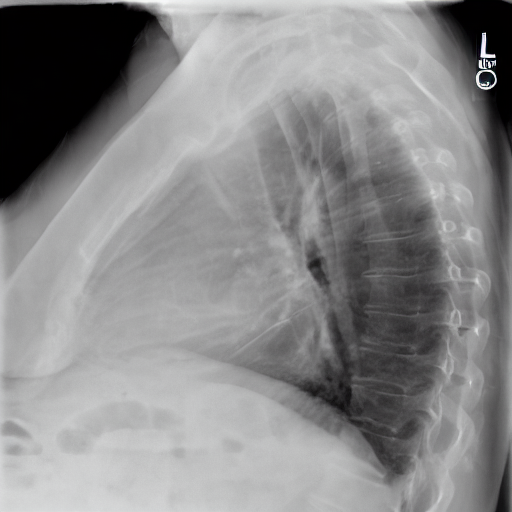

{'Atelectasis': np.float32(0.47191414), 'Consolidation': np.float32(0.5294217), 'Infiltration': np.float32(0.52008724), 'Pneumothorax': np.float32(0.50581956), 'Edema': np.float32(0.104434334), 'Emphysema': np.float32(0.50402594), 'Fibrosis': np.float32(0.51543486), 'Effusion': np.float32(0.41721478), 'Pneumonia': np.float32(0.5263796), 'Pleural_Thickening': np.float32(0.505314), 'Cardiomegaly': np.float32(0.15420249), 'Nodule': np.float32(0.51373136), 'Mass': np.float32(0.5473566), 'Hernia': np.float32(0.015067695), 'Lung Lesion': np.float32(0.008258512), 'Fracture': np.float32(0.3043222), 'Lung Opacity': np.float32(0.84299654), 'Enlarged Cardiomediastinum': np.float32(0.5245358)}


  0%|          | 0/75 [00:00<?, ?it/s]

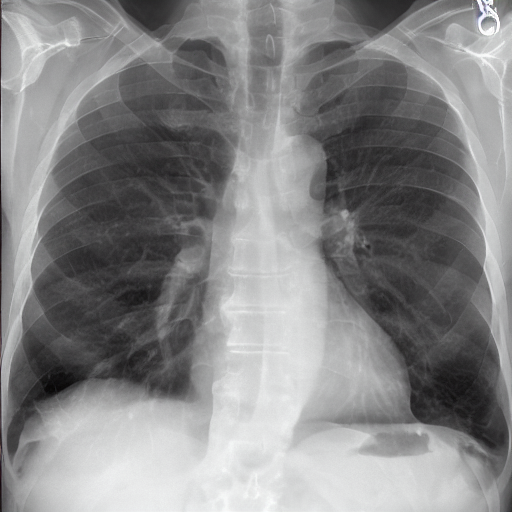

{'Atelectasis': np.float32(0.09973928), 'Consolidation': np.float32(0.09648198), 'Infiltration': np.float32(0.34739852), 'Pneumothorax': np.float32(0.5013062), 'Edema': np.float32(0.013525175), 'Emphysema': np.float32(0.5063921), 'Fibrosis': np.float32(0.50455177), 'Effusion': np.float32(0.0844987), 'Pneumonia': np.float32(0.056252964), 'Pleural_Thickening': np.float32(0.41380298), 'Cardiomegaly': np.float32(0.09802246), 'Nodule': np.float32(0.5037178), 'Mass': np.float32(0.50052434), 'Hernia': np.float32(0.009619031), 'Lung Lesion': np.float32(0.047008276), 'Fracture': np.float32(0.22010764), 'Lung Opacity': np.float32(0.08924919), 'Enlarged Cardiomediastinum': np.float32(0.0700907)}


  0%|          | 0/75 [00:00<?, ?it/s]

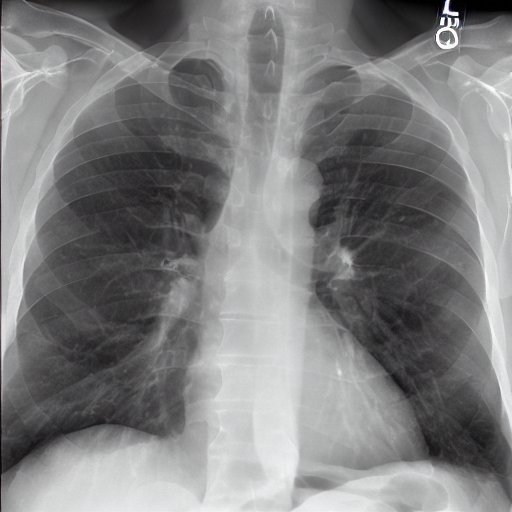

{'Atelectasis': np.float32(0.15032919), 'Consolidation': np.float32(0.09934778), 'Infiltration': np.float32(0.50198925), 'Pneumothorax': np.float32(0.3520768), 'Edema': np.float32(0.012755657), 'Emphysema': np.float32(0.5124804), 'Fibrosis': np.float32(0.50366104), 'Effusion': np.float32(0.059261657), 'Pneumonia': np.float32(0.07013442), 'Pleural_Thickening': np.float32(0.42766124), 'Cardiomegaly': np.float32(0.35840598), 'Nodule': np.float32(0.51829004), 'Mass': np.float32(0.4529645), 'Hernia': np.float32(0.003991314), 'Lung Lesion': np.float32(0.07239641), 'Fracture': np.float32(0.36434627), 'Lung Opacity': np.float32(0.075981036), 'Enlarged Cardiomediastinum': np.float32(0.13503551)}


In [17]:
# Test classifier with some edema examples

print('PULMONARY EDEMA')
for i in range(5):
    prompt = "pulmonary edema"
    img = generate_image(prompt)
    display(img)
    print(get_predictions(img))

print('NO PULMONARY EDEMA')
for i in range(5):
    prompt = "no pulmonary edema"
    img = generate_image(prompt)
    display(img)
    print(get_predictions(img))

PULMONARY EDEMA


  0%|          | 0/75 [00:00<?, ?it/s]

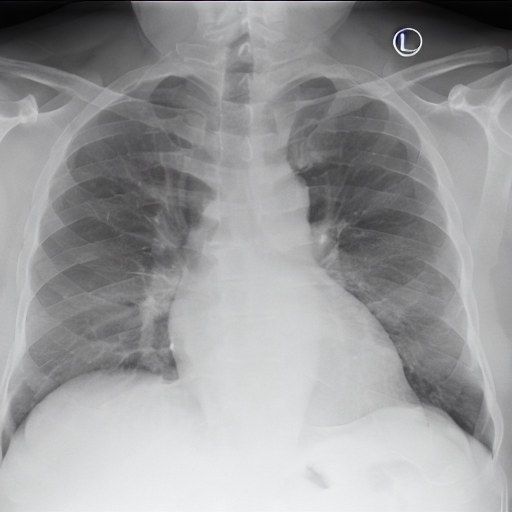

{'Atelectasis': np.float32(0.4172194), 'Consolidation': np.float32(0.14002672), 'Infiltration': np.float32(0.3113464), 'Pneumothorax': np.float32(0.057042334), 'Edema': np.float32(0.034441784), 'Emphysema': np.float32(0.50076103), 'Fibrosis': np.float32(0.5103216), 'Effusion': np.float32(0.18076758), 'Pneumonia': np.float32(0.003888174), 'Pleural_Thickening': np.float32(0.26649806), 'Cardiomegaly': np.float32(0.5636581), 'Nodule': np.float32(0.49554604), 'Mass': np.float32(0.32640186), 'Hernia': np.float32(0.02250077), 'Lung Lesion': np.float32(0.011052277), 'Fracture': np.float32(0.13317406), 'Lung Opacity': np.float32(0.2946424), 'Enlarged Cardiomediastinum': np.float32(0.19679551)}


  0%|          | 0/75 [00:00<?, ?it/s]

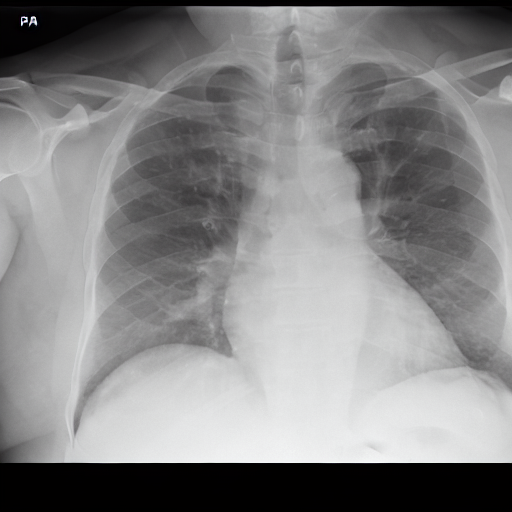

{'Atelectasis': np.float32(0.20023407), 'Consolidation': np.float32(0.06377408), 'Infiltration': np.float32(0.35142326), 'Pneumothorax': np.float32(0.05278411), 'Edema': np.float32(0.027390948), 'Emphysema': np.float32(0.4670258), 'Fibrosis': np.float32(0.50227547), 'Effusion': np.float32(0.08569301), 'Pneumonia': np.float32(0.0029669306), 'Pleural_Thickening': np.float32(0.34096426), 'Cardiomegaly': np.float32(0.57081217), 'Nodule': np.float32(0.40424284), 'Mass': np.float32(0.2047653), 'Hernia': np.float32(0.012929269), 'Lung Lesion': np.float32(0.003057791), 'Fracture': np.float32(0.11305311), 'Lung Opacity': np.float32(0.15678418), 'Enlarged Cardiomediastinum': np.float32(0.17948505)}


  0%|          | 0/75 [00:00<?, ?it/s]

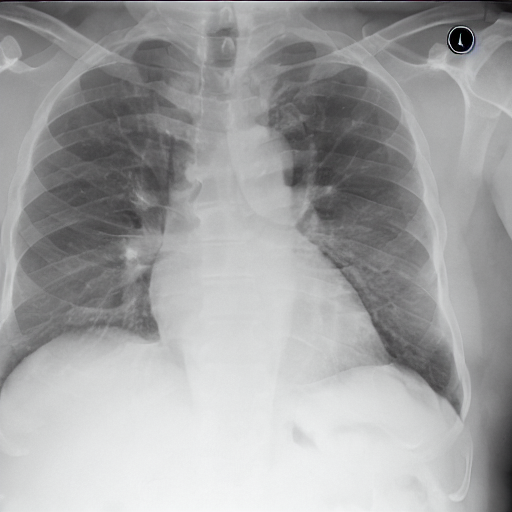

{'Atelectasis': np.float32(0.39551094), 'Consolidation': np.float32(0.12509741), 'Infiltration': np.float32(0.5016557), 'Pneumothorax': np.float32(0.08916535), 'Edema': np.float32(0.066623315), 'Emphysema': np.float32(0.5005312), 'Fibrosis': np.float32(0.5089985), 'Effusion': np.float32(0.171718), 'Pneumonia': np.float32(0.01692605), 'Pleural_Thickening': np.float32(0.33187163), 'Cardiomegaly': np.float32(0.5664973), 'Nodule': np.float32(0.50676864), 'Mass': np.float32(0.49718064), 'Hernia': np.float32(0.16608976), 'Lung Lesion': np.float32(0.018473107), 'Fracture': np.float32(0.2252868), 'Lung Opacity': np.float32(0.21144716), 'Enlarged Cardiomediastinum': np.float32(0.24966235)}


  0%|          | 0/75 [00:00<?, ?it/s]

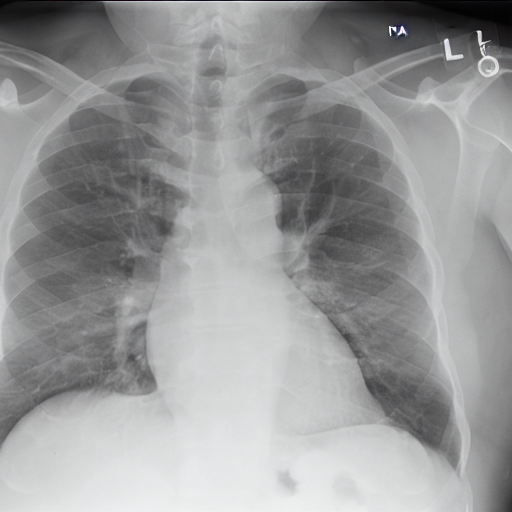

{'Atelectasis': np.float32(0.31039068), 'Consolidation': np.float32(0.10573999), 'Infiltration': np.float32(0.38759482), 'Pneumothorax': np.float32(0.07289323), 'Edema': np.float32(0.029593792), 'Emphysema': np.float32(0.4487654), 'Fibrosis': np.float32(0.50371563), 'Effusion': np.float32(0.14300828), 'Pneumonia': np.float32(0.0036107034), 'Pleural_Thickening': np.float32(0.2607634), 'Cardiomegaly': np.float32(0.53490794), 'Nodule': np.float32(0.48511308), 'Mass': np.float32(0.30563948), 'Hernia': np.float32(0.027301176), 'Lung Lesion': np.float32(0.0045181825), 'Fracture': np.float32(0.15719672), 'Lung Opacity': np.float32(0.2696662), 'Enlarged Cardiomediastinum': np.float32(0.17684923)}


  0%|          | 0/75 [00:00<?, ?it/s]

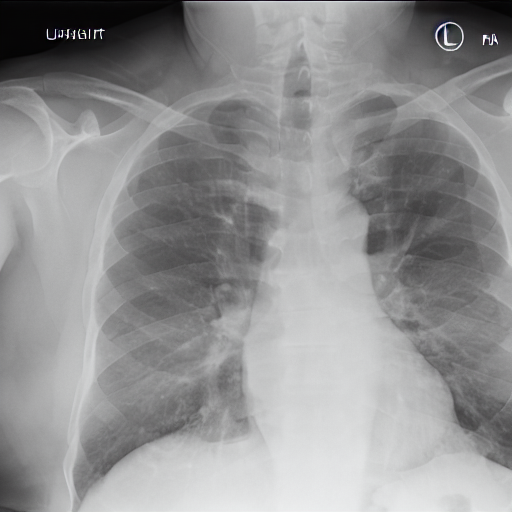

{'Atelectasis': np.float32(0.509768), 'Consolidation': np.float32(0.24170294), 'Infiltration': np.float32(0.40488806), 'Pneumothorax': np.float32(0.10850923), 'Edema': np.float32(0.008117711), 'Emphysema': np.float32(0.5037849), 'Fibrosis': np.float32(0.5209971), 'Effusion': np.float32(0.24528965), 'Pneumonia': np.float32(0.0015633975), 'Pleural_Thickening': np.float32(0.5030199), 'Cardiomegaly': np.float32(0.51033413), 'Nodule': np.float32(0.50259006), 'Mass': np.float32(0.5140828), 'Hernia': np.float32(0.29121214), 'Lung Lesion': np.float32(0.0038087987), 'Fracture': np.float32(0.15765381), 'Lung Opacity': np.float32(0.48497412), 'Enlarged Cardiomediastinum': np.float32(0.17478512)}


  0%|          | 0/75 [00:00<?, ?it/s]

Potential NSFW content was detected in one or more images. A black image will be returned instead. Try again with a different prompt and/or seed.


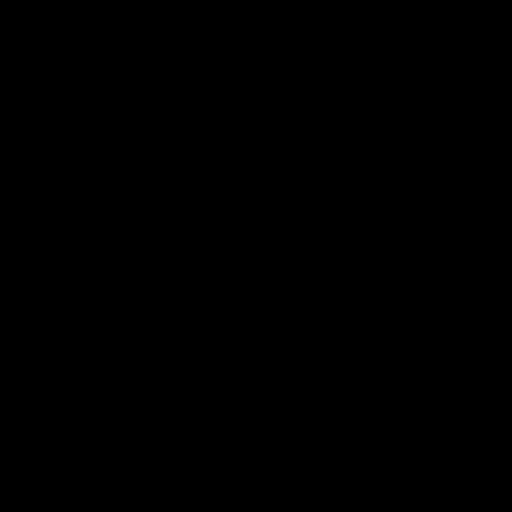

{'Atelectasis': np.float32(0.51973844), 'Consolidation': np.float32(0.21981679), 'Infiltration': np.float32(0.5025375), 'Pneumothorax': np.float32(0.13134807), 'Edema': np.float32(0.20385356), 'Emphysema': np.float32(0.51409143), 'Fibrosis': np.float32(0.11954721), 'Effusion': np.float32(0.23054142), 'Pneumonia': np.float32(0.59007436), 'Pleural_Thickening': np.float32(0.5203053), 'Cardiomegaly': np.float32(0.4203433), 'Nodule': np.float32(0.4741263), 'Mass': np.float32(0.13579012), 'Hernia': np.float32(0.2209644), 'Lung Lesion': np.float32(0.28202996), 'Fracture': np.float32(0.47745264), 'Lung Opacity': np.float32(0.62391186), 'Enlarged Cardiomediastinum': np.float32(0.52023673)}


  0%|          | 0/75 [00:00<?, ?it/s]

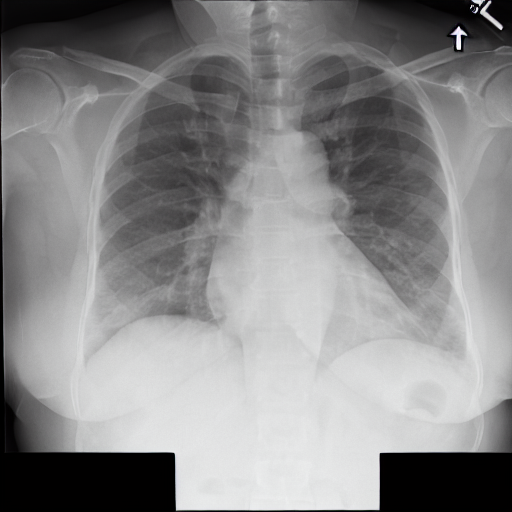

{'Atelectasis': np.float32(0.4888936), 'Consolidation': np.float32(0.120812654), 'Infiltration': np.float32(0.46452713), 'Pneumothorax': np.float32(0.090084866), 'Edema': np.float32(0.05426878), 'Emphysema': np.float32(0.48719034), 'Fibrosis': np.float32(0.5121789), 'Effusion': np.float32(0.19660954), 'Pneumonia': np.float32(0.033396903), 'Pleural_Thickening': np.float32(0.46799853), 'Cardiomegaly': np.float32(0.6198175), 'Nodule': np.float32(0.50100225), 'Mass': np.float32(0.2582917), 'Hernia': np.float32(0.008457808), 'Lung Lesion': np.float32(0.0022205093), 'Fracture': np.float32(0.16763999), 'Lung Opacity': np.float32(0.36434147), 'Enlarged Cardiomediastinum': np.float32(0.2404233)}


  0%|          | 0/75 [00:00<?, ?it/s]

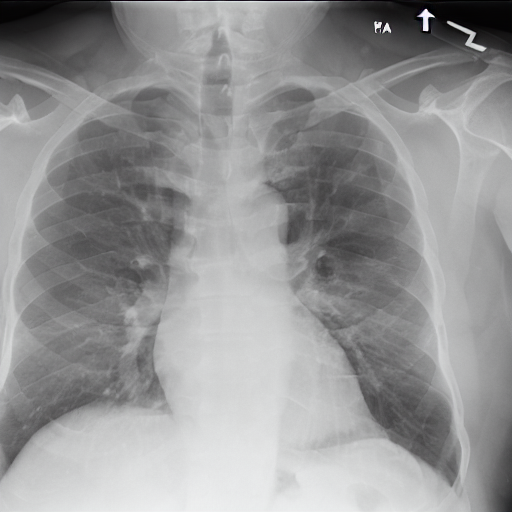

{'Atelectasis': np.float32(0.30529168), 'Consolidation': np.float32(0.25236386), 'Infiltration': np.float32(0.5005632), 'Pneumothorax': np.float32(0.15925361), 'Edema': np.float32(0.013411498), 'Emphysema': np.float32(0.45310986), 'Fibrosis': np.float32(0.5134624), 'Effusion': np.float32(0.15857944), 'Pneumonia': np.float32(0.008051128), 'Pleural_Thickening': np.float32(0.5080766), 'Cardiomegaly': np.float32(0.24773856), 'Nodule': np.float32(0.50175047), 'Mass': np.float32(0.5040258), 'Hernia': np.float32(0.05241594), 'Lung Lesion': np.float32(0.002760465), 'Fracture': np.float32(0.14734612), 'Lung Opacity': np.float32(0.29594982), 'Enlarged Cardiomediastinum': np.float32(0.13210212)}


  0%|          | 0/75 [00:00<?, ?it/s]

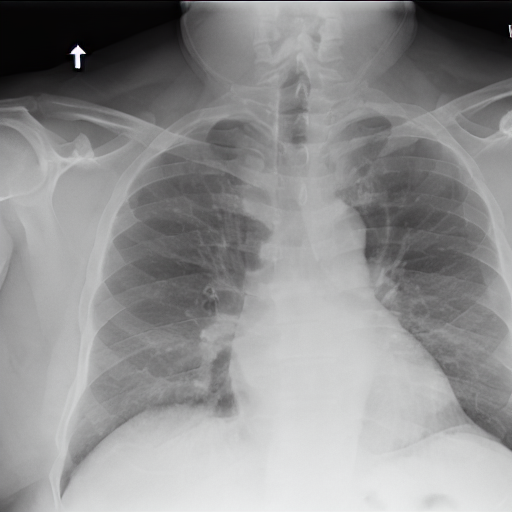

{'Atelectasis': np.float32(0.4092715), 'Consolidation': np.float32(0.20245796), 'Infiltration': np.float32(0.3524797), 'Pneumothorax': np.float32(0.06161978), 'Edema': np.float32(0.04626579), 'Emphysema': np.float32(0.50108874), 'Fibrosis': np.float32(0.5135895), 'Effusion': np.float32(0.2188444), 'Pneumonia': np.float32(0.0049567698), 'Pleural_Thickening': np.float32(0.34187797), 'Cardiomegaly': np.float32(0.58293134), 'Nodule': np.float32(0.38921446), 'Mass': np.float32(0.28653514), 'Hernia': np.float32(0.015484685), 'Lung Lesion': np.float32(0.0056737573), 'Fracture': np.float32(0.11565066), 'Lung Opacity': np.float32(0.39078972), 'Enlarged Cardiomediastinum': np.float32(0.3512008)}


  0%|          | 0/75 [00:00<?, ?it/s]

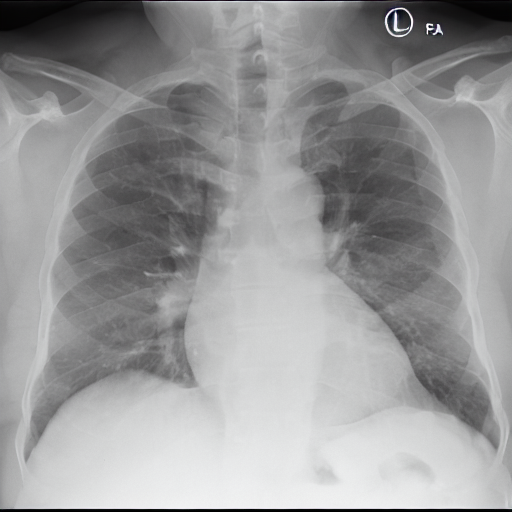

{'Atelectasis': np.float32(0.3221393), 'Consolidation': np.float32(0.08380573), 'Infiltration': np.float32(0.36054406), 'Pneumothorax': np.float32(0.048815817), 'Edema': np.float32(0.022372952), 'Emphysema': np.float32(0.5000062), 'Fibrosis': np.float32(0.50506735), 'Effusion': np.float32(0.13118923), 'Pneumonia': np.float32(0.0015042389), 'Pleural_Thickening': np.float32(0.26260862), 'Cardiomegaly': np.float32(0.54800856), 'Nodule': np.float32(0.4195872), 'Mass': np.float32(0.24156903), 'Hernia': np.float32(0.021862784), 'Lung Lesion': np.float32(0.0028562169), 'Fracture': np.float32(0.116597354), 'Lung Opacity': np.float32(0.23241794), 'Enlarged Cardiomediastinum': np.float32(0.14485951)}


  0%|          | 0/75 [00:00<?, ?it/s]

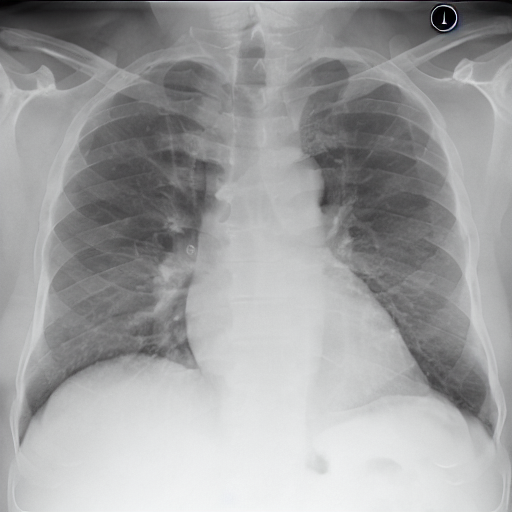

{'Atelectasis': np.float32(0.33713117), 'Consolidation': np.float32(0.11820221), 'Infiltration': np.float32(0.43519175), 'Pneumothorax': np.float32(0.055609528), 'Edema': np.float32(0.03002223), 'Emphysema': np.float32(0.50004196), 'Fibrosis': np.float32(0.5066017), 'Effusion': np.float32(0.11080816), 'Pneumonia': np.float32(0.0027112816), 'Pleural_Thickening': np.float32(0.2928057), 'Cardiomegaly': np.float32(0.52544904), 'Nodule': np.float32(0.5015198), 'Mass': np.float32(0.41289586), 'Hernia': np.float32(0.081310324), 'Lung Lesion': np.float32(0.013990109), 'Fracture': np.float32(0.13712466), 'Lung Opacity': np.float32(0.24978863), 'Enlarged Cardiomediastinum': np.float32(0.17509073)}


  0%|          | 0/75 [00:00<?, ?it/s]

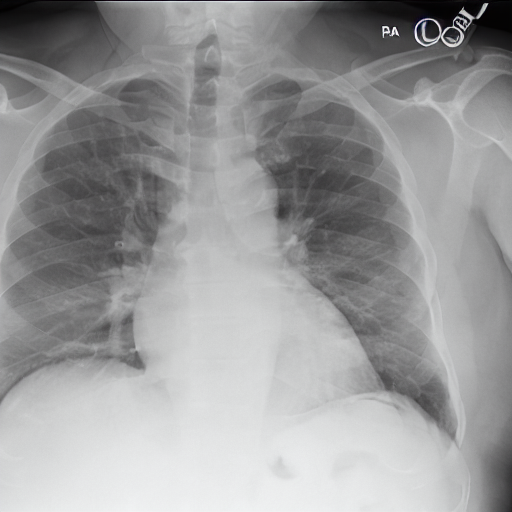

{'Atelectasis': np.float32(0.50963867), 'Consolidation': np.float32(0.20014612), 'Infiltration': np.float32(0.40033272), 'Pneumothorax': np.float32(0.08336837), 'Edema': np.float32(0.055812374), 'Emphysema': np.float32(0.5008974), 'Fibrosis': np.float32(0.5067254), 'Effusion': np.float32(0.2913255), 'Pneumonia': np.float32(0.008899271), 'Pleural_Thickening': np.float32(0.26400304), 'Cardiomegaly': np.float32(0.57626593), 'Nodule': np.float32(0.4898863), 'Mass': np.float32(0.5070002), 'Hernia': np.float32(0.12572235), 'Lung Lesion': np.float32(0.0190176), 'Fracture': np.float32(0.16832924), 'Lung Opacity': np.float32(0.39489934), 'Enlarged Cardiomediastinum': np.float32(0.28814834)}


  0%|          | 0/75 [00:00<?, ?it/s]

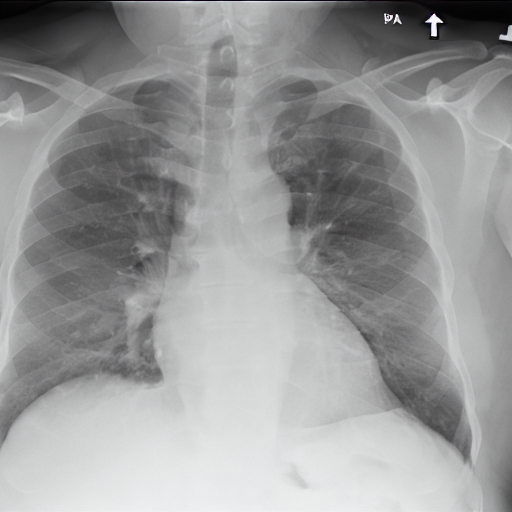

{'Atelectasis': np.float32(0.3434563), 'Consolidation': np.float32(0.12390717), 'Infiltration': np.float32(0.32724044), 'Pneumothorax': np.float32(0.071559906), 'Edema': np.float32(0.039375763), 'Emphysema': np.float32(0.5001265), 'Fibrosis': np.float32(0.507056), 'Effusion': np.float32(0.16510418), 'Pneumonia': np.float32(0.0058301976), 'Pleural_Thickening': np.float32(0.31910282), 'Cardiomegaly': np.float32(0.55736756), 'Nodule': np.float32(0.4788314), 'Mass': np.float32(0.28275755), 'Hernia': np.float32(0.016216354), 'Lung Lesion': np.float32(0.00562252), 'Fracture': np.float32(0.13533816), 'Lung Opacity': np.float32(0.24751335), 'Enlarged Cardiomediastinum': np.float32(0.23868228)}


  0%|          | 0/75 [00:00<?, ?it/s]

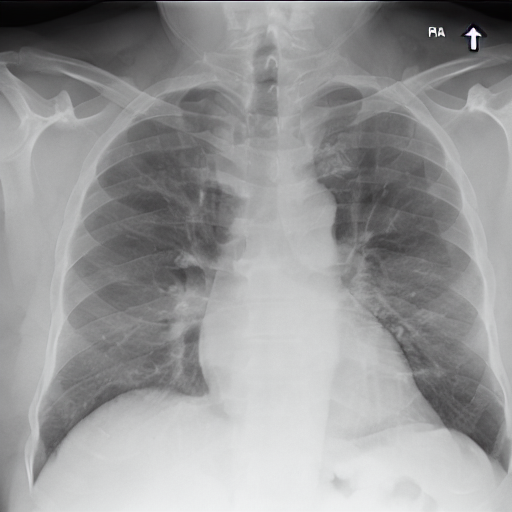

{'Atelectasis': np.float32(0.40018928), 'Consolidation': np.float32(0.13114233), 'Infiltration': np.float32(0.3746729), 'Pneumothorax': np.float32(0.059818625), 'Edema': np.float32(0.015355054), 'Emphysema': np.float32(0.5003526), 'Fibrosis': np.float32(0.51052034), 'Effusion': np.float32(0.112638764), 'Pneumonia': np.float32(0.0037023125), 'Pleural_Thickening': np.float32(0.28058216), 'Cardiomegaly': np.float32(0.50810045), 'Nodule': np.float32(0.5018306), 'Mass': np.float32(0.31361294), 'Hernia': np.float32(0.020355606), 'Lung Lesion': np.float32(0.0066301166), 'Fracture': np.float32(0.12871733), 'Lung Opacity': np.float32(0.35757068), 'Enlarged Cardiomediastinum': np.float32(0.16240016)}


  0%|          | 0/75 [00:00<?, ?it/s]

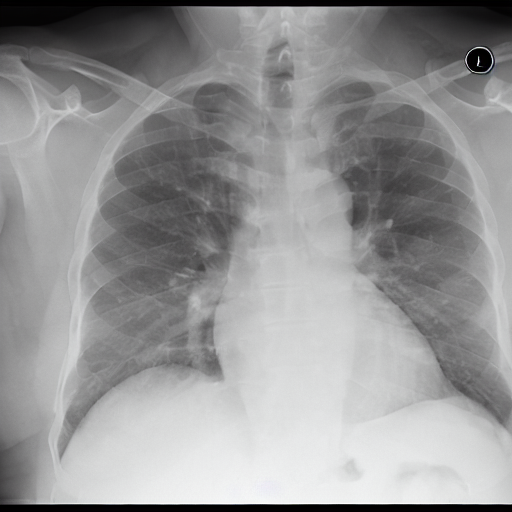

{'Atelectasis': np.float32(0.28097653), 'Consolidation': np.float32(0.07254516), 'Infiltration': np.float32(0.37201062), 'Pneumothorax': np.float32(0.054061193), 'Edema': np.float32(0.02248966), 'Emphysema': np.float32(0.50029314), 'Fibrosis': np.float32(0.506413), 'Effusion': np.float32(0.106778756), 'Pneumonia': np.float32(0.0022334745), 'Pleural_Thickening': np.float32(0.31874064), 'Cardiomegaly': np.float32(0.5713084), 'Nodule': np.float32(0.5036551), 'Mass': np.float32(0.27234417), 'Hernia': np.float32(0.028632361), 'Lung Lesion': np.float32(0.0038909991), 'Fracture': np.float32(0.17365114), 'Lung Opacity': np.float32(0.26540884), 'Enlarged Cardiomediastinum': np.float32(0.16737923)}


  0%|          | 0/75 [00:00<?, ?it/s]

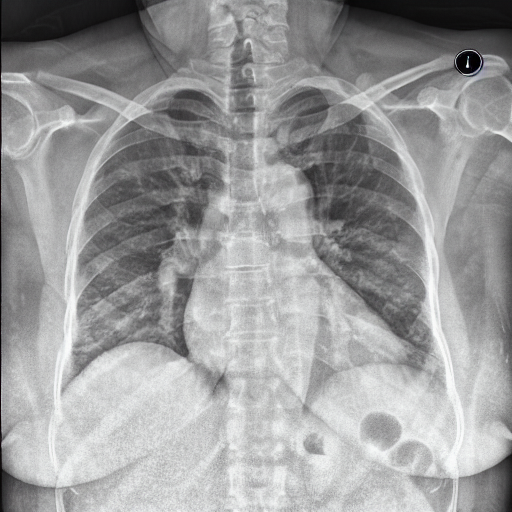

{'Atelectasis': np.float32(0.5355453), 'Consolidation': np.float32(0.38735816), 'Infiltration': np.float32(0.5436276), 'Pneumothorax': np.float32(0.516798), 'Edema': np.float32(0.12938477), 'Emphysema': np.float32(0.20321088), 'Fibrosis': np.float32(0.25857043), 'Effusion': np.float32(0.22353573), 'Pneumonia': np.float32(0.5288383), 'Pleural_Thickening': np.float32(0.079551354), 'Cardiomegaly': np.float32(0.5581621), 'Nodule': np.float32(0.5036371), 'Mass': np.float32(0.50670993), 'Hernia': np.float32(0.026267773), 'Lung Lesion': np.float32(0.064861044), 'Fracture': np.float32(0.5358747), 'Lung Opacity': np.float32(0.52280724), 'Enlarged Cardiomediastinum': np.float32(0.53119916)}


  0%|          | 0/75 [00:00<?, ?it/s]

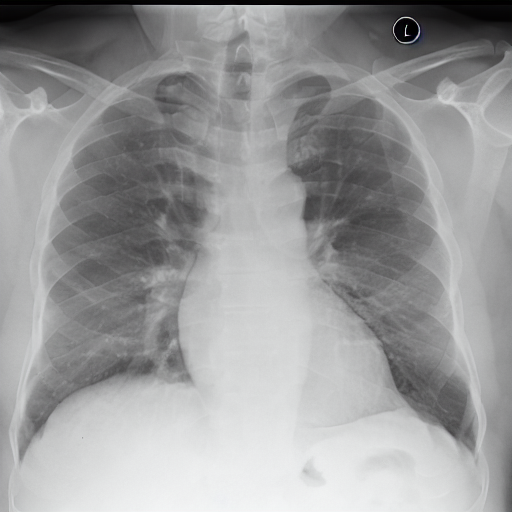

{'Atelectasis': np.float32(0.24669638), 'Consolidation': np.float32(0.08877218), 'Infiltration': np.float32(0.39966366), 'Pneumothorax': np.float32(0.04881396), 'Edema': np.float32(0.015173146), 'Emphysema': np.float32(0.4160634), 'Fibrosis': np.float32(0.50748086), 'Effusion': np.float32(0.077772595), 'Pneumonia': np.float32(0.0012018876), 'Pleural_Thickening': np.float32(0.3493038), 'Cardiomegaly': np.float32(0.37618038), 'Nodule': np.float32(0.5004578), 'Mass': np.float32(0.38122416), 'Hernia': np.float32(0.025117818), 'Lung Lesion': np.float32(0.009119742), 'Fracture': np.float32(0.12749876), 'Lung Opacity': np.float32(0.2484333), 'Enlarged Cardiomediastinum': np.float32(0.11947687)}


  0%|          | 0/75 [00:00<?, ?it/s]

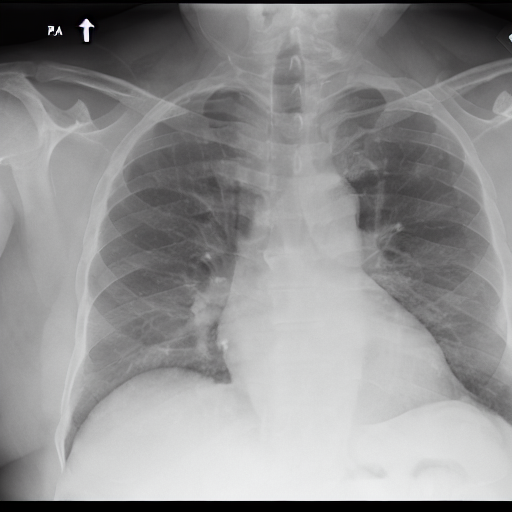

{'Atelectasis': np.float32(0.2112836), 'Consolidation': np.float32(0.07850771), 'Infiltration': np.float32(0.3920943), 'Pneumothorax': np.float32(0.05894413), 'Edema': np.float32(0.04310939), 'Emphysema': np.float32(0.43932378), 'Fibrosis': np.float32(0.5005082), 'Effusion': np.float32(0.15058622), 'Pneumonia': np.float32(0.0017702716), 'Pleural_Thickening': np.float32(0.19191241), 'Cardiomegaly': np.float32(0.5996976), 'Nodule': np.float32(0.35116878), 'Mass': np.float32(0.17970932), 'Hernia': np.float32(0.014805276), 'Lung Lesion': np.float32(0.0041671144), 'Fracture': np.float32(0.10284213), 'Lung Opacity': np.float32(0.1846097), 'Enlarged Cardiomediastinum': np.float32(0.16155025)}


  0%|          | 0/75 [00:00<?, ?it/s]

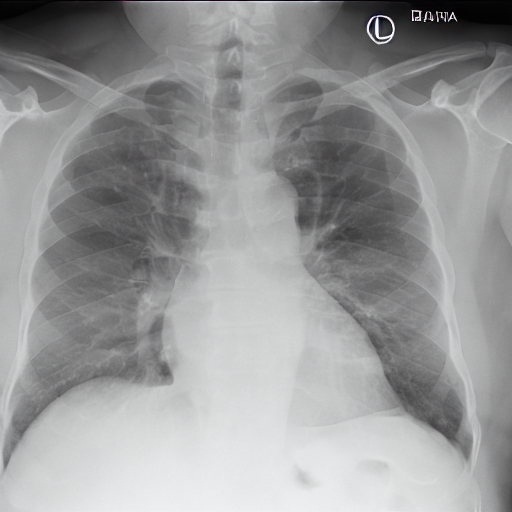

{'Atelectasis': np.float32(0.40493006), 'Consolidation': np.float32(0.12739836), 'Infiltration': np.float32(0.26979798), 'Pneumothorax': np.float32(0.039070617), 'Edema': np.float32(0.031433742), 'Emphysema': np.float32(0.5001668), 'Fibrosis': np.float32(0.5054562), 'Effusion': np.float32(0.16015868), 'Pneumonia': np.float32(0.0052035362), 'Pleural_Thickening': np.float32(0.21422288), 'Cardiomegaly': np.float32(0.5582582), 'Nodule': np.float32(0.33316344), 'Mass': np.float32(0.16226287), 'Hernia': np.float32(0.009277515), 'Lung Lesion': np.float32(0.005447129), 'Fracture': np.float32(0.09541675), 'Lung Opacity': np.float32(0.22756511), 'Enlarged Cardiomediastinum': np.float32(0.16835041)}


  0%|          | 0/75 [00:00<?, ?it/s]

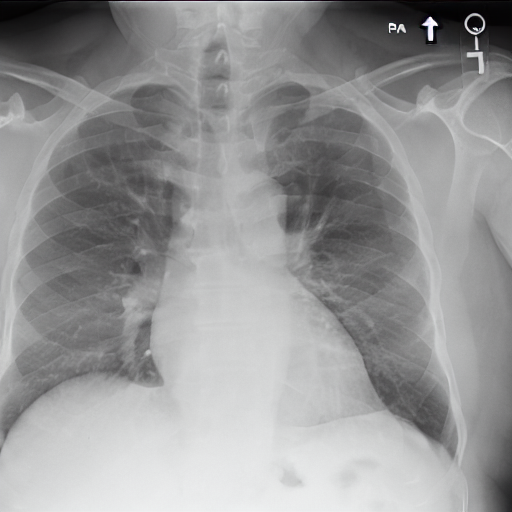

{'Atelectasis': np.float32(0.28067046), 'Consolidation': np.float32(0.10142229), 'Infiltration': np.float32(0.35009325), 'Pneumothorax': np.float32(0.085035585), 'Edema': np.float32(0.042857595), 'Emphysema': np.float32(0.3636874), 'Fibrosis': np.float32(0.5005155), 'Effusion': np.float32(0.16138653), 'Pneumonia': np.float32(0.006644511), 'Pleural_Thickening': np.float32(0.19965534), 'Cardiomegaly': np.float32(0.5548496), 'Nodule': np.float32(0.36334613), 'Mass': np.float32(0.15936568), 'Hernia': np.float32(0.010891721), 'Lung Lesion': np.float32(0.004304279), 'Fracture': np.float32(0.11760154), 'Lung Opacity': np.float32(0.15916619), 'Enlarged Cardiomediastinum': np.float32(0.15943779)}


In [19]:
print('PULMONARY EDEMA')
for i in range(20):
    prompt = "pulmonary edema, posterior anterior (PA) view"
    img = generate_image(prompt)
    display(img)
    print(get_predictions(img))

#### 

In [ ]:
!python /clusteruy/home/jplago/mcdaa-thesis/ignore/create_synthetic_data/edema_300.py

Loading pipeline components...:   0%|                     | 0/7 [00:00<?, ?it/s]

In [1]:
!nvidia-smi

Mon May 12 07:53:34 2025       
+---------------------------------------------------------------------------------------+
| NVIDIA-SMI 530.30.02              Driver Version: 530.30.02    CUDA Version: 12.1     |
|-----------------------------------------+----------------------+----------------------+
| GPU  Name                  Persistence-M| Bus-Id        Disp.A | Volatile Uncorr. ECC |
| Fan  Temp  Perf            Pwr:Usage/Cap|         Memory-Usage | GPU-Util  Compute M. |
|                                         |                      |               MIG M. |
|=========================================+======================+======================|
|   0  Tesla P100-PCIE-12GB            Off| 00000000:37:00.0 Off |                    0 |
| N/A   39C    P0               27W / 250W|      0MiB / 12288MiB |      1%      Default |
|                                         |                      |                  N/A |
+-----------------------------------------+----------------------+--

In [1]:
!python eval_prob_adaptive.py --dataset cxr_test --extra effusion_300 --version roentgen_v1 --model_path /clusteruy/home/jplago/roentgen/roentgen/ --n_trials 1 --to_keep 1 --n_samples 500 --loss l1 --prompt_path prompts/mimic_cxr_effusion.csv --csv_file ../../datasets/test_pleural_effusion_300.csv --dataset_base_path /clusteruy/home/jplago/mimic-cxr-jpg/

python: can't open file '/clusteruy/home/jplago/mcdaa-thesis/notebooks/eval_prob_adaptive.py': [Errno 2] No such file or directory
